# Solar Model 

# Import Data 

In [2]:
import pandas as pd
from matplotlib import pyplot
from pandas import to_datetime
from matplotlib.dates import DateFormatter, DayLocator
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
from pandas.plotting import lag_plot
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_pacf
from pandas import read_csv
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
import missingno as msno
import numpy as np

In [3]:
#from prophet import Prophet

In [4]:
df_2018 = pd.read_csv("C:\\Users\\parit\\Documents\\Cap_A\\dallas_solar_energy_2018._1.csv", header=0 , parse_dates=[0])
df_2019 = pd.read_csv("C:\\Users\\parit\\Documents\\Cap_A\\dallas_solar_energy_2019_1.csv", header=0 , parse_dates=[0])

In [5]:
df_2018['timestamp_solar'].dtype

dtype('<M8[ns]')

In [6]:
df_2018['timestamp_solar'].dtype

dtype('<M8[ns]')

In [7]:
df = df_2018.append(df_2019)

In [8]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
0,2018-01-01 00:00:00,-12.0,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.407,77.87,115.95,0.90,0.87,1025.0,0.2,327.0,3.6
1,2018-01-01 00:30:00,-12.3,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.408,79.77,121.59,0.89,0.87,1025.0,0.2,328.0,3.6
2,2018-01-01 01:00:00,-12.6,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.409,79.97,127.26,0.89,0.87,1025.0,0.2,329.0,3.6
3,2018-01-01 01:30:00,-12.8,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.410,81.27,132.94,0.89,0.87,1025.0,0.2,330.0,3.5
4,2018-01-01 02:00:00,-13.0,1.19,0.0233,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.410,81.76,138.55,0.89,0.87,1025.0,0.2,331.0,3.5


In [9]:
df.describe()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
count,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,...,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000
mean,11.766176,1.282487,0.128485,0.603205,6.751722,3.970269,46.885046,334.158562,230.526541,146.356535,...,154.598430,0.317480,81.867844,89.658675,0.936512,0.127027,1015.886045,2.284512,200.756250,2.503487
std,10.131908,0.258515,0.099858,0.014874,16.135516,7.305178,57.318750,369.916702,301.273925,260.134414,...,241.780163,0.039107,14.416188,35.775904,0.025990,0.186049,7.917711,1.485795,98.111755,1.234120
min,-16.900000,0.140000,0.014500,0.580000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.208000,29.960000,17.290000,0.830000,0.050000,985.000000,0.100000,0.000000,0.100000
25%,3.100000,1.140000,0.057200,0.590000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.293000,72.430000,61.910000,0.920000,0.070000,1011.000000,1.000000,123.000000,1.600000
50%,11.800000,1.290000,0.098100,0.600000,0.000000,0.000000,9.000000,52.000000,9.000000,0.000000,...,5.000000,0.312000,84.930000,89.450000,0.940000,0.080000,1016.000000,2.000000,210.000000,2.300000
75%,20.700000,1.430000,0.171300,0.610000,3.150000,6.210000,87.000000,738.000000,454.000000,244.000000,...,233.000000,0.335000,94.060000,117.482500,0.960000,0.090000,1021.000000,3.400000,286.000000,3.200000
max,34.400000,2.110000,1.102700,0.630000,80.000000,80.000000,346.000000,1024.000000,1009.000000,1027.000000,...,1009.000000,0.466000,100.000000,162.680000,1.000000,0.870000,1042.000000,6.600000,360.000000,9.600000


In [10]:
df['timestamp_solar'].dtype

dtype('<M8[ns]')

In [11]:
df["timestamp_solar"]=pd.to_datetime(df["timestamp_solar"],utc='true')

In [12]:
df['timestamp_solar'].dtype

datetime64[ns, UTC]

In [13]:
df.shape

(35040, 26)

In [14]:
features = df.copy()

In [15]:
features['year'] = df['timestamp_solar'].dt.year

In [16]:
features['month'] = df['timestamp_solar'].dt.month

In [17]:
features['day'] = df['timestamp_solar'].dt.day

In [18]:
features.head(5)

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day
0,2018-01-01 00:00:00+00:00,-12.0,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,115.95,0.90,0.87,1025.0,0.2,327.0,3.6,2018,1,1
1,2018-01-01 00:30:00+00:00,-12.3,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,121.59,0.89,0.87,1025.0,0.2,328.0,3.6,2018,1,1
2,2018-01-01 01:00:00+00:00,-12.6,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,127.26,0.89,0.87,1025.0,0.2,329.0,3.6,2018,1,1
3,2018-01-01 01:30:00+00:00,-12.8,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,132.94,0.89,0.87,1025.0,0.2,330.0,3.5,2018,1,1
4,2018-01-01 02:00:00+00:00,-13.0,1.19,0.0233,0.61,0.0,0.0,0.0,0.0,0.0,...,138.55,0.89,0.87,1025.0,0.2,331.0,3.5,2018,1,1


# Time Series - Data Visualization

In [19]:
df.shape

(35040, 26)

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\core\arrays\datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


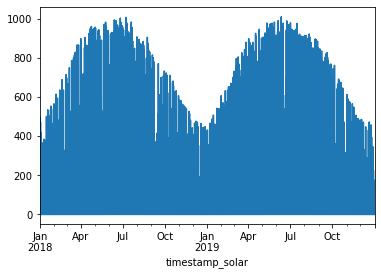

In [20]:
df.index = df['timestamp_solar'] 
df['ghi'].plot()

## Zooming In

In [21]:
# 5 day trend of data
df_z5 = df[(df['timestamp_solar'] > '2018-01-01 00:00:00+00:00') & (df['timestamp_solar'] <= '2018-01-08 00:00:00+00:00	')].copy()

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\core\arrays\datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


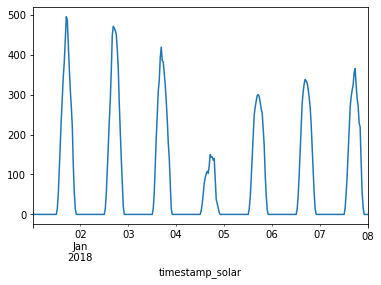

In [22]:
df_z5['ghi'].plot()

## Removing Seasonality

In [23]:
df['year'] = df['timestamp_solar'].dt.year

In [24]:
df['month'] = df['timestamp_solar'].dt.month

In [25]:
df['day'] = df['timestamp_solar'].dt.day

In [26]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00+00:00,2018-01-01 00:00:00+00:00,-12.0,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,115.95,0.90,0.87,1025.0,0.2,327.0,3.6,2018,1,1
2018-01-01 00:30:00+00:00,2018-01-01 00:30:00+00:00,-12.3,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,121.59,0.89,0.87,1025.0,0.2,328.0,3.6,2018,1,1
2018-01-01 01:00:00+00:00,2018-01-01 01:00:00+00:00,-12.6,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,127.26,0.89,0.87,1025.0,0.2,329.0,3.6,2018,1,1
2018-01-01 01:30:00+00:00,2018-01-01 01:30:00+00:00,-12.8,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,132.94,0.89,0.87,1025.0,0.2,330.0,3.5,2018,1,1
2018-01-01 02:00:00+00:00,2018-01-01 02:00:00+00:00,-13.0,1.19,0.0233,0.61,0.0,0.0,0.0,0.0,0.0,...,138.55,0.89,0.87,1025.0,0.2,331.0,3.5,2018,1,1


In [27]:
df['year'] = df['timestamp_solar'].dt.year

In [28]:
df.groupby('month')['ghi'].mean()

month
1      77.606855
2     100.196057
3     157.730511
4     184.773264
5     205.027218
6     245.140972
7     253.304435
8     220.609879
9     154.481944
10    109.107863
11     83.173958
12     60.349798
Name: ghi, dtype: float64

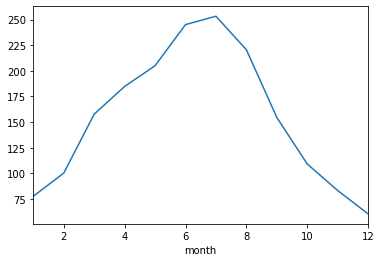

In [29]:
df.groupby('month')['ghi'].mean().plot()

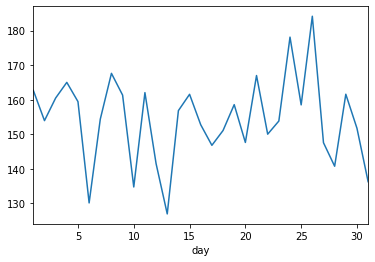

In [30]:
df.groupby('day')['ghi'].mean().plot()

In [31]:
df['lag1'] =  df['ghi'].shift(17520)

In [32]:
df.shape

(35040, 30)

In [33]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day,lag1
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00+00:00,2018-01-01 00:00:00+00:00,-12.0,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,0.90,0.87,1025.0,0.2,327.0,3.6,2018,1,1,NaN
2018-01-01 00:30:00+00:00,2018-01-01 00:30:00+00:00,-12.3,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,...,0.89,0.87,1025.0,0.2,328.0,3.6,2018,1,1,NaN
2018-01-01 01:00:00+00:00,2018-01-01 01:00:00+00:00,-12.6,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,0.89,0.87,1025.0,0.2,329.0,3.6,2018,1,1,NaN
2018-01-01 01:30:00+00:00,2018-01-01 01:30:00+00:00,-12.8,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,...,0.89,0.87,1025.0,0.2,330.0,3.5,2018,1,1,NaN
2018-01-01 02:00:00+00:00,2018-01-01 02:00:00+00:00,-13.0,1.19,0.0233,0.61,0.0,0.0,0.0,0.0,0.0,...,0.89,0.87,1025.0,0.2,331.0,3.5,2018,1,1,NaN


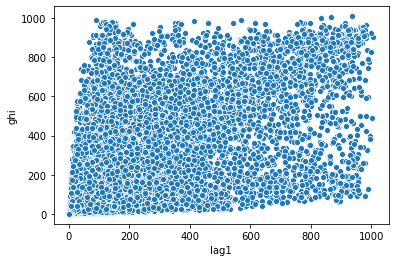

In [34]:
sns.scatterplot(x=df['lag1'], y=df['ghi'])

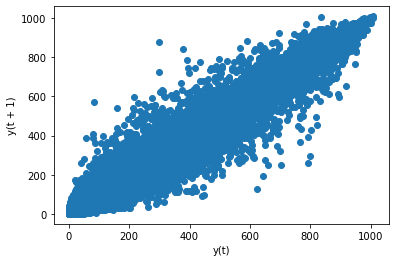

In [35]:
lag_plot(df['ghi'])

In [44]:
df.shape

(35040, 30)

# Decomposing Time Series¶

## Additive Model

y(t) = Level + Trend + Seasonality + Noise

In [37]:
df2 = df.set_index('timestamp_solar').asfreq('D')

In [38]:
df2.head()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day,lag1
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00+00:00,-12.0,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.90,0.87,1025.0,0.2,327.0,3.6,2018,1,1,NaN
2018-01-02 00:00:00+00:00,-10.5,1.07,0.0358,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.91,0.46,1027.0,0.2,297.0,3.1,2018,1,2,NaN
2018-01-03 00:00:00+00:00,-8.1,1.07,0.0265,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.90,0.46,1026.0,0.3,259.0,3.5,2018,1,3,NaN
2018-01-04 00:00:00+00:00,-5.1,1.31,0.0318,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.92,0.46,1018.0,0.5,79.0,1.3,2018,1,4,NaN
2018-01-05 00:00:00+00:00,-4.8,1.20,0.0671,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.95,0.46,997.0,0.7,299.0,6.7,2018,1,5,NaN


In [39]:
result = seasonal_decompose(df2['ghi'], model='additive')

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\core\arrays\datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning: 


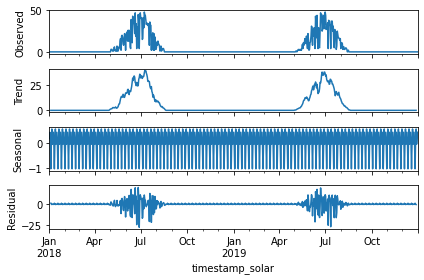

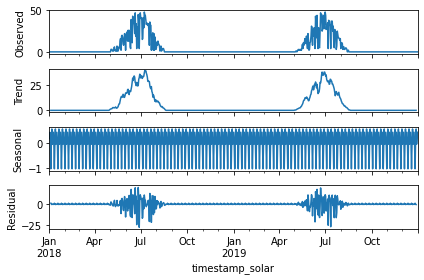

In [40]:
result.plot()

# Autocorrelation Plots

<Figure size 7200x7200 with 0 Axes>

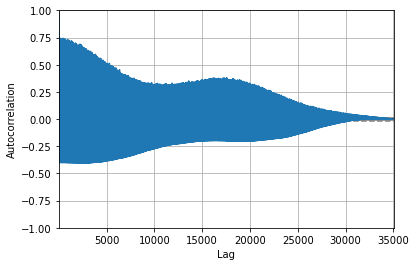

<Figure size 7200x7200 with 0 Axes>

In [45]:
autocorrelation_plot(df['ghi'])
plt.figure(figsize=(100, 100))

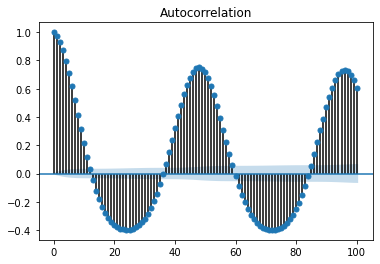

<Figure size 2160x1440 with 0 Axes>

In [46]:
from statsmodels.graphics import tsaplots
import matplotlib.pyplot as plt
df_ghi =df['ghi']
#plot autocorrelation function
fig = tsaplots.plot_acf(df_ghi, lags=100)
plt.figure(figsize=(30, 20))
plt.show()

In [47]:
df.shape

(35040, 30)

# Partial Autocorrelation Graph

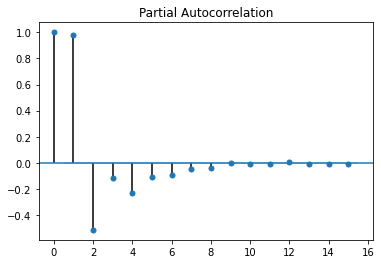

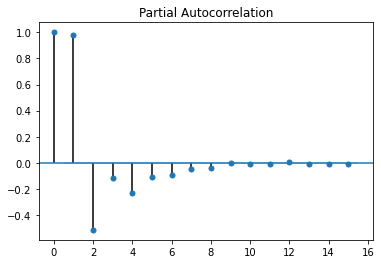

In [48]:
plot_pacf(df['ghi'], lags=15)

In [49]:
df.shape

(35040, 30)

In [50]:
#Quaterly Plot
quarterly_ghi_df = df.resample('Q', on='timestamp_solar').mean()

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\core\arrays\datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


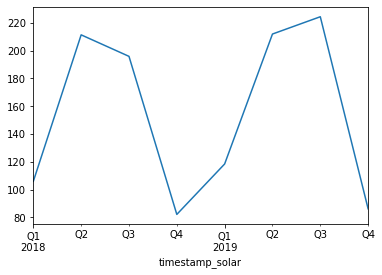

In [51]:
quarterly_ghi_df.ghi.plot()

In [52]:
df.shape

(35040, 30)

In [53]:
#Monthly Plot
monthly_ghi_df = df.resample('M', on='timestamp_solar').mean()

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\core\arrays\datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


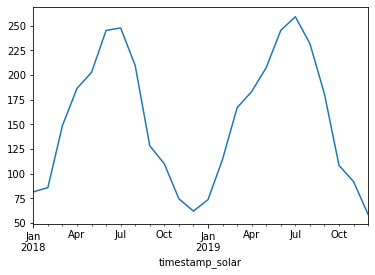

In [54]:
monthly_ghi_df.ghi.plot()

In [55]:
df.shape

(35040, 30)

# Decomposing Time Series

## Additive Model

y(t) = Level + Trend + Seasonality + Noise

In [56]:
df2 = df.set_index('timestamp_solar').asfreq('D')

In [57]:
df2.head()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day,lag1
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00+00:00,-12.0,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.90,0.87,1025.0,0.2,327.0,3.6,2018,1,1,NaN
2018-01-02 00:00:00+00:00,-10.5,1.07,0.0358,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.91,0.46,1027.0,0.2,297.0,3.1,2018,1,2,NaN
2018-01-03 00:00:00+00:00,-8.1,1.07,0.0265,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.90,0.46,1026.0,0.3,259.0,3.5,2018,1,3,NaN
2018-01-04 00:00:00+00:00,-5.1,1.31,0.0318,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.92,0.46,1018.0,0.5,79.0,1.3,2018,1,4,NaN
2018-01-05 00:00:00+00:00,-4.8,1.20,0.0671,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.95,0.46,997.0,0.7,299.0,6.7,2018,1,5,NaN


In [58]:
result = seasonal_decompose(df2['ghi'], model='additive')

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\core\arrays\datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning: 


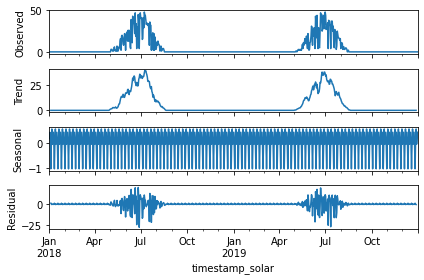

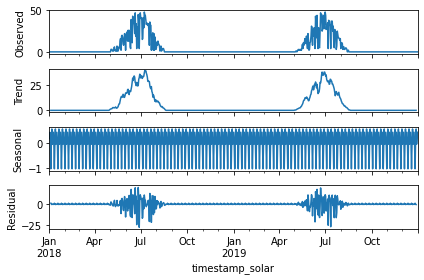

In [59]:
result.plot()

In [60]:
df.shape

(35040, 30)

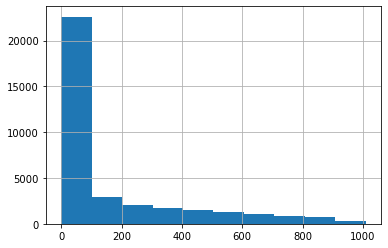

In [61]:

#series = read_csv('daily-minimum-temperatures.csv', header=0, index_col=0, parse_dates=True, squeeze=True)
df.ghi.hist()
pyplot.show()

# Missing Data

In [62]:
df1=df[['air_temperature', 'alpha', 'aod', 'asymmetry', 'cld_opd_dcomp',
       'cld_reff_dcomp', 'clearsky_dhi', 'clearsky_dni', 'clearsky_ghi',
       'cloud_press_acha', 'cloud_type', 'dew_point', 'dhi', 'dni',
       'fill_flag', 'ghi', 'ozone', 'relative_humidity', 'solar_zenith_angle',
       'ssa', 'surface_albedo', 'surface_pressure', 'total_precipitable_water',
       'wind_direction', 'wind_speed']]

In [63]:
df1.head()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00+00:00,-12.0,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.407,77.87,115.95,0.90,0.87,1025.0,0.2,327.0,3.6
2018-01-01 00:30:00+00:00,-12.3,1.19,0.0225,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.408,79.77,121.59,0.89,0.87,1025.0,0.2,328.0,3.6
2018-01-01 01:00:00+00:00,-12.6,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.409,79.97,127.26,0.89,0.87,1025.0,0.2,329.0,3.6
2018-01-01 01:30:00+00:00,-12.8,1.19,0.0227,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.410,81.27,132.94,0.89,0.87,1025.0,0.2,330.0,3.5
2018-01-01 02:00:00+00:00,-13.0,1.19,0.0233,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.410,81.76,138.55,0.89,0.87,1025.0,0.2,331.0,3.5


In [64]:
df1.shape

(35040, 25)

In [65]:
df2=df.drop(columns = ['day','year','month'])

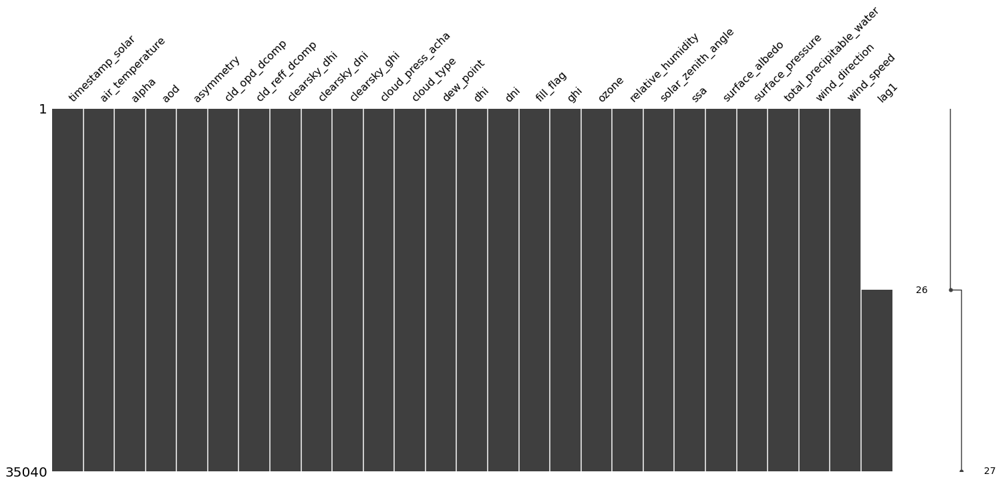

In [66]:
msno.matrix(df2)
# No missing data found

# Correlation

In [67]:
df1.corr()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
air_temperature,1.000000,0.415360,0.484410,-0.678619,0.075463,0.031443,0.405642,0.252634,0.380173,0.071484,...,0.367159,-0.322731,-0.101714,-0.440965,0.216237,-0.320865,-0.262506,0.799979,-0.157327,-0.380753
alpha,0.415360,1.000000,0.364568,-0.362035,-0.147822,-0.113385,0.153227,0.039777,0.104270,-0.046997,...,0.178924,-0.049047,-0.133339,-0.147597,-0.242815,-0.115089,-0.013093,0.222483,0.097116,-0.429009
aod,0.484410,0.364568,1.000000,-0.170614,0.184753,0.109528,0.355011,-0.014455,0.140738,0.121622,...,0.041443,0.023159,0.186306,-0.212906,0.478193,-0.112617,-0.190415,0.586292,-0.179062,-0.271764
asymmetry,-0.678619,-0.362035,-0.170614,1.000000,0.041411,0.054838,-0.076020,-0.016767,-0.066558,0.025454,...,-0.093989,0.445065,0.046083,0.110768,-0.027615,0.204475,0.077729,-0.553005,0.096822,0.249773
cld_opd_dcomp,0.075463,-0.147822,0.184753,0.041411,1.000000,0.613547,0.407860,0.310913,0.279690,0.481358,...,-0.089579,-0.064987,0.067715,-0.341407,0.328818,0.009819,-0.145882,0.223014,-0.164951,0.139210
cld_reff_dcomp,0.031443,-0.113385,0.109528,0.054838,0.613547,1.000000,0.453051,0.444545,0.347947,0.595425,...,0.044133,-0.042452,-0.062288,-0.425217,0.227455,0.040284,-0.080415,0.120157,-0.128173,0.116984
clearsky_dhi,0.405642,0.153227,0.355011,-0.076020,0.407860,0.453051,1.000000,0.839415,0.906357,0.507777,...,0.711747,0.045941,-0.506641,-0.866953,0.161930,-0.026387,-0.088080,0.241611,-0.094365,-0.064809
clearsky_dni,0.252634,0.039777,-0.014455,-0.016767,0.310913,0.444545,0.839415,1.000000,0.909679,0.486504,...,0.792498,0.043724,-0.673509,-0.881253,-0.044071,-0.010563,-0.015243,0.007138,-0.005809,0.035055
clearsky_ghi,0.380173,0.104270,0.140738,-0.066558,0.279690,0.347947,0.906357,0.909679,1.000000,0.408748,...,0.867253,0.058315,-0.647322,-0.886704,0.034230,-0.036705,-0.058179,0.137044,-0.045847,-0.035114
cloud_press_acha,0.071484,-0.046997,0.121622,0.025454,0.481358,0.595425,0.507777,0.486504,0.408748,1.000000,...,0.129208,-0.006516,-0.181138,-0.467544,0.209717,0.045586,-0.061168,0.088424,-0.064865,0.084618


In [68]:
df=df.drop("lag1", axis='columns')

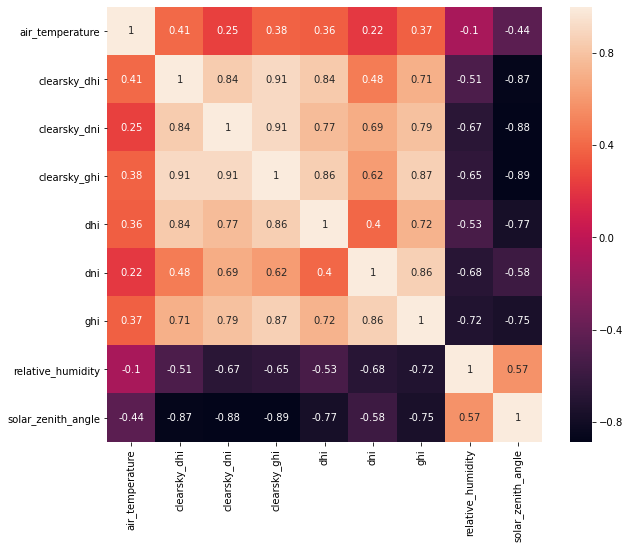

In [69]:
correlation = df.corr()
Corr = correlation.index[abs(correlation['ghi'])>.3]
f, ax=plt.subplots(figsize=(10,8))
sns.heatmap(df[Corr].corr(), square=True, annot=True)


In [70]:
df2=df('air_temperature', 'clearsky_dhi', 'clearsky_dni','clearsky_dni','dhi', 'dni', 'ghi', 'relative_humidity', 'solar_zenith_angle')

TypeError: 'DataFrame' object is not callable

## Correlation Heat Map

Text(0.5, 1.0, 'HeatMap-Correlation Matrix')

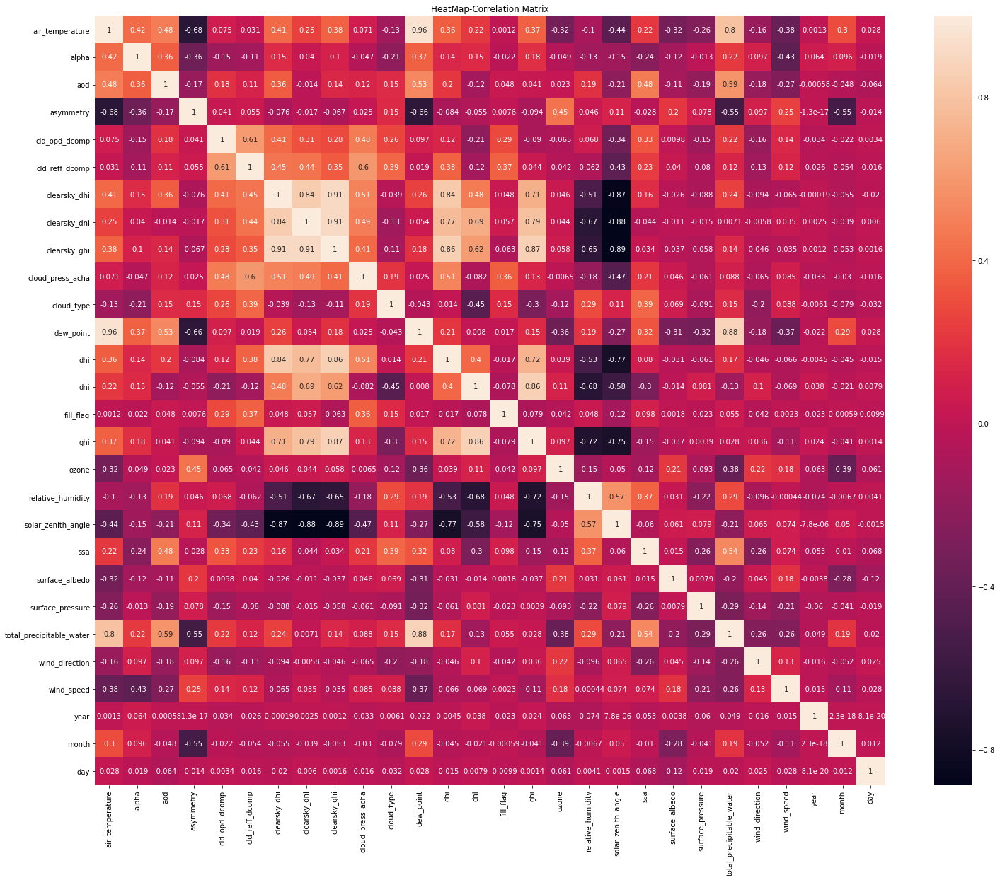

In [71]:
#heatmap - correlation matrix
plt.figure(figsize=(25, 20))
sns.heatmap(df.corr(), annot=True)
plt.title('HeatMap-Correlation Matrix')

# Box Plot

In [72]:
cont_summary = df1.describe()
cont_summary

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
count,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,...,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000
mean,11.766176,1.282487,0.128485,0.603205,6.751722,3.970269,46.885046,334.158562,230.526541,146.356535,...,154.598430,0.317480,81.867844,89.658675,0.936512,0.127027,1015.886045,2.284512,200.756250,2.503487
std,10.131908,0.258515,0.099858,0.014874,16.135516,7.305178,57.318750,369.916702,301.273925,260.134414,...,241.780163,0.039107,14.416188,35.775904,0.025990,0.186049,7.917711,1.485795,98.111755,1.234120
min,-16.900000,0.140000,0.014500,0.580000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.208000,29.960000,17.290000,0.830000,0.050000,985.000000,0.100000,0.000000,0.100000
25%,3.100000,1.140000,0.057200,0.590000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.293000,72.430000,61.910000,0.920000,0.070000,1011.000000,1.000000,123.000000,1.600000
50%,11.800000,1.290000,0.098100,0.600000,0.000000,0.000000,9.000000,52.000000,9.000000,0.000000,...,5.000000,0.312000,84.930000,89.450000,0.940000,0.080000,1016.000000,2.000000,210.000000,2.300000
75%,20.700000,1.430000,0.171300,0.610000,3.150000,6.210000,87.000000,738.000000,454.000000,244.000000,...,233.000000,0.335000,94.060000,117.482500,0.960000,0.090000,1021.000000,3.400000,286.000000,3.200000
max,34.400000,2.110000,1.102700,0.630000,80.000000,80.000000,346.000000,1024.000000,1009.000000,1027.000000,...,1009.000000,0.466000,100.000000,162.680000,1.000000,0.870000,1042.000000,6.600000,360.000000,9.600000


In [73]:
#Continous Variable Column
cont_summary.columns

Index(['air_temperature', 'alpha', 'aod', 'asymmetry', 'cld_opd_dcomp',
       'cld_reff_dcomp', 'clearsky_dhi', 'clearsky_dni', 'clearsky_ghi',
       'cloud_press_acha', 'cloud_type', 'dew_point', 'dhi', 'dni',
       'fill_flag', 'ghi', 'ozone', 'relative_humidity', 'solar_zenith_angle',
       'ssa', 'surface_albedo', 'surface_pressure', 'total_precipitable_water',
       'wind_direction', 'wind_speed'],
      dtype='object')

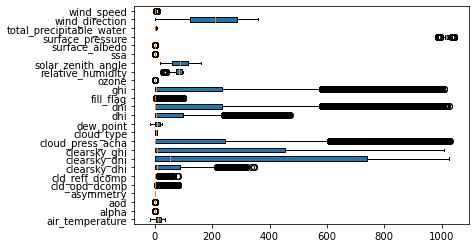

In [74]:
box_plot_data=[df.air_temperature, df.alpha, df.aod, df.asymmetry, df.cld_opd_dcomp,df.cld_reff_dcomp, df.clearsky_dhi,df.clearsky_dni,df.clearsky_ghi,df.cloud_press_acha,df.cloud_type,df.dew_point,df.dhi,df.dni,df.fill_flag, df.ghi, df.ozone,df.relative_humidity,df.solar_zenith_angle,df.ssa, df.surface_albedo, df.surface_pressure, df.total_precipitable_water,df.wind_direction,df.wind_speed]
plt.boxplot(box_plot_data,patch_artist=True, vert=0, labels=['air_temperature', 'alpha', 'aod', 'asymmetry', 'cld_opd_dcomp','cld_reff_dcomp', 'clearsky_dhi', 'clearsky_dni', 'clearsky_ghi','cloud_press_acha', 'cloud_type', 'dew_point', 'dhi', 'dni','fill_flag', 'ghi', 'ozone', 'relative_humidity', 'solar_zenith_angle','ssa', 'surface_albedo', 'surface_pressure', 'total_precipitable_water', 'wind_direction', 'wind_speed'])
plt.show()

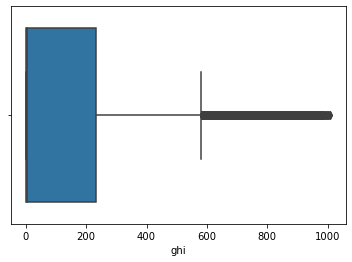

In [75]:
sns.boxplot(x=df['ghi'])

# Pairplot

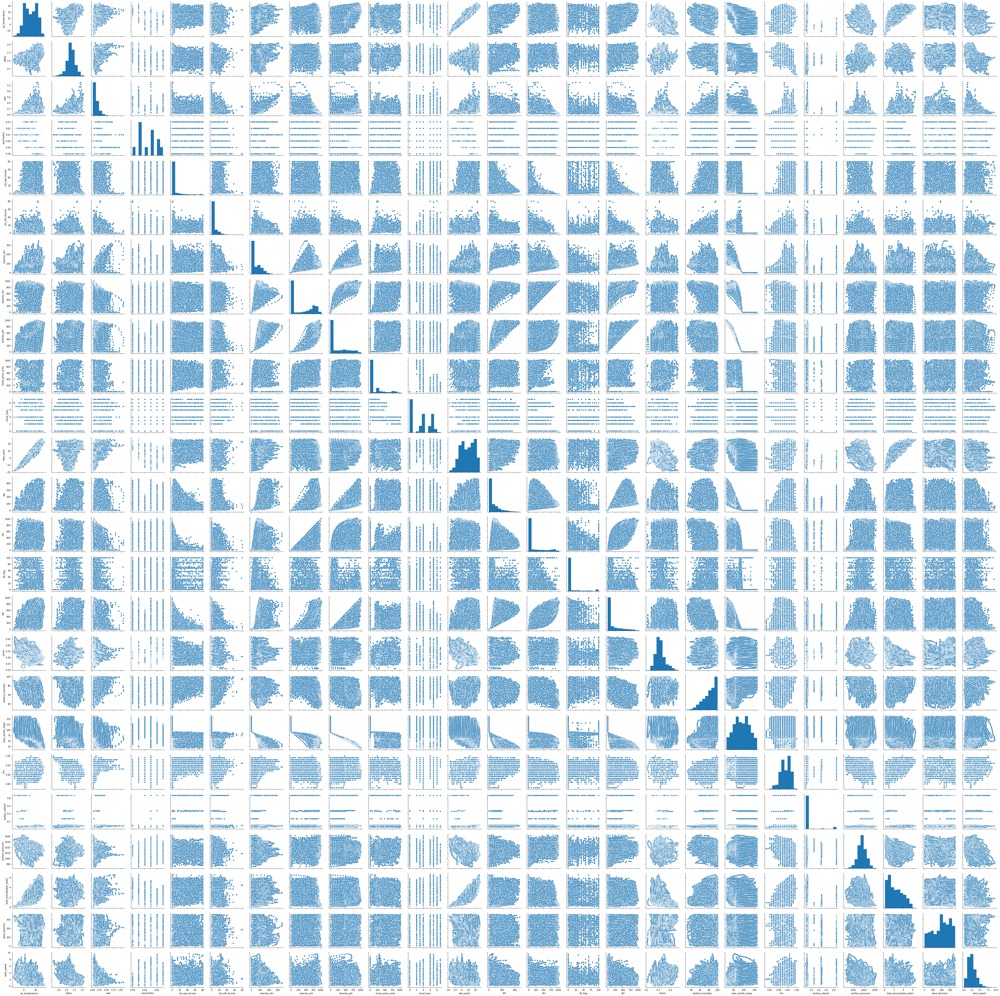

In [76]:
# Create the default pairplot
sns.pairplot(df1)

# Variable Distributions

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
C:\Users\parit

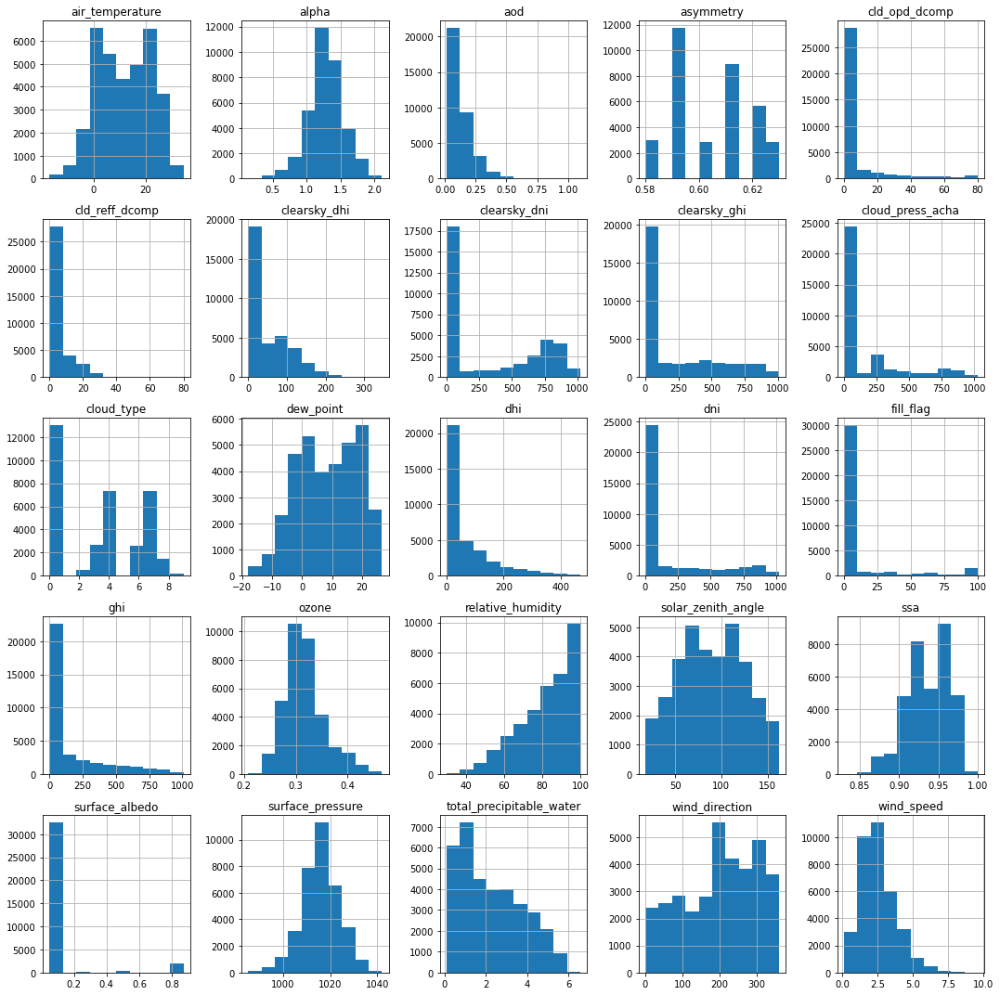

In [77]:
df1.hist(figsize=(15,15)) 
#set a large figsize if you have > 9 variables
plt.tight_layout()
plt.show()

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\seaborn\relational.py:792: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  x, y = np.asarray(x), np.asarray(y)
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\seaborn\relational.py:792: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  x, y = np.asarray(x), np.asarray(y)
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\seaborn\relational.py:792: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  x, y = np.asarray(x), np.asarray(y)
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\seaborn\relational.py:792: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  x, y = np.asarray(x), np.asarray(y)
C:\Users\parit\Anaconda\envs\Captstone_36\lib\site

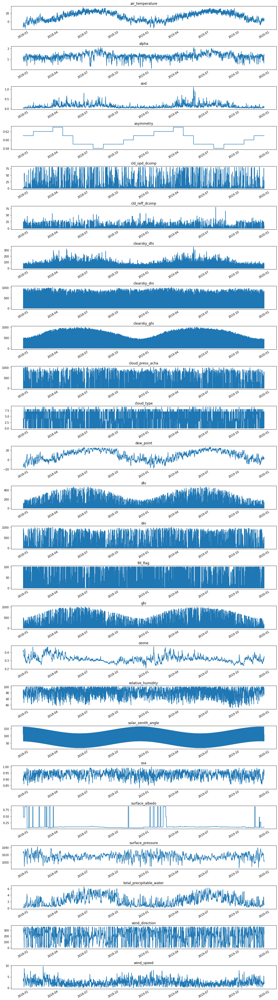

In [78]:
# Plot line charts
df_plot = df1.copy()

list_length = df_plot.shape[1]
ncols = 2
nrows = int(round(list_length / ncols, 0))

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, figsize=(14, 50))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
for i in range(0, list_length):
        ax = plt.subplot(25,1,i+1)
        sns.lineplot(data = df_plot.iloc[:, i], ax=ax)
        ax.set_title(df_plot.columns[i])
        ax.tick_params(axis="x", rotation=30, labelsize=10, length=0)
       # ax.xaxis.set_major_locator(timestamp_solar.AutoDateLocator())
fig.tight_layout()
plt.show()

# Creating the Train and Validation set

In [84]:
df_2020 = pd.read_csv("C:\\Users\\parit\\Documents\\Cap_A\\dallas_solar_energy_2020 _1.csv", header=0 , parse_dates=[0])

In [85]:
df.dtypes

timestamp_solar             datetime64[ns, UTC]
air_temperature                         float64
alpha                                   float64
aod                                     float64
asymmetry                               float64
cld_opd_dcomp                           float64
cld_reff_dcomp                          float64
clearsky_dhi                            float64
clearsky_dni                            float64
clearsky_ghi                            float64
cloud_press_acha                        float64
cloud_type                              float64
dew_point                               float64
dhi                                     float64
dni                                     float64
fill_flag                               float64
ghi                                     float64
ozone                                   float64
relative_humidity                       float64
solar_zenith_angle                      float64
ssa                                     

In [86]:
df1= df.apply(pd.to_numeric, errors='coerce').fillna(0).astype(int)
df1.dtypes

timestamp_solar             int32
air_temperature             int32
alpha                       int32
aod                         int32
asymmetry                   int32
cld_opd_dcomp               int32
cld_reff_dcomp              int32
clearsky_dhi                int32
clearsky_dni                int32
clearsky_ghi                int32
cloud_press_acha            int32
cloud_type                  int32
dew_point                   int32
dhi                         int32
dni                         int32
fill_flag                   int32
ghi                         int32
ozone                       int32
relative_humidity           int32
solar_zenith_angle          int32
ssa                         int32
surface_albedo              int32
surface_pressure            int32
total_precipitable_water    int32
wind_direction              int32
wind_speed                  int32
year                        int32
month                       int32
day                         int32
dtype: object

In [87]:
df.shape

(35040, 29)

In [88]:
df_2020.shape

(17568, 26)

In [90]:
train = df[:]
valid = df_2020[0:48]
print(train.shape)
print(valid.shape)

(35040, 29)
(48, 26)


                          timestamp_solar  air_temperature  alpha     aod  \
timestamp_solar                                                             
2018-01-01 00:30:00+00:00        00:30:00             -0.3    0.0  0.0000   
2018-01-01 01:00:00+00:00        00:30:00             -0.3    0.0  0.0002   
2018-01-01 01:30:00+00:00        00:30:00             -0.2    0.0  0.0000   
2018-01-01 02:00:00+00:00        00:30:00             -0.2    0.0  0.0006   
2018-01-01 02:30:00+00:00        00:30:00             -0.1    0.0  0.0000   

                           asymmetry  cld_opd_dcomp  cld_reff_dcomp  \
timestamp_solar                                                       
2018-01-01 00:30:00+00:00        0.0            0.0             0.0   
2018-01-01 01:00:00+00:00        0.0            0.0             0.0   
2018-01-01 01:30:00+00:00        0.0            0.0             0.0   
2018-01-01 02:00:00+00:00        0.0            0.0             0.0   
2018-01-01 02:30:00+00:00        0

C:\Users\parit\Anaconda\envs\Captstone_36\lib\site-packages\pandas\core\arrays\datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


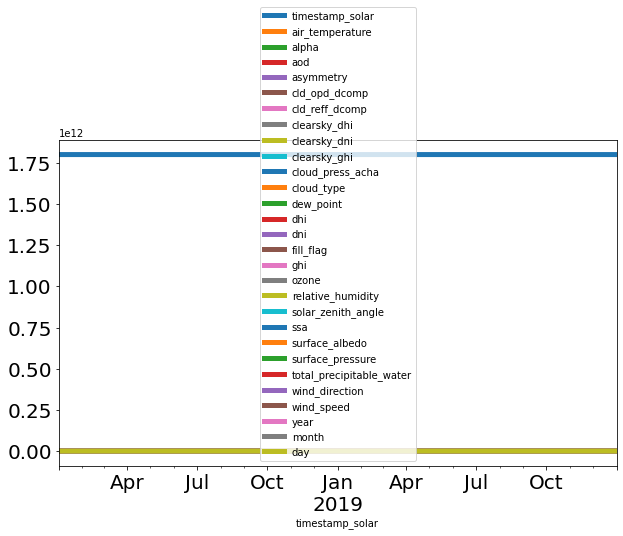

In [91]:
df_tr_diff = train.diff()
df_tr_diff.dropna(inplace=True)
print(df_tr_diff.head())
df_tr_diff.plot(figsize=(10,6), linewidth=5, fontsize=20)
plt.show()
#https://towardsdatascience.com/vector-autoregressive-for-forecasting-time-series-a60e6f168c70

In [80]:
train_array = train[:]
print(train_array.shape)

test_array = valid[:]
print(test_array.shape)

(28032, 29)
(7008, 29)


## Check for Stationarity of the Time-Series data

In [81]:

from statsmodels.tsa.stattools import adfuller

print("p-value:", adfuller(train.ghi.dropna())[1])

p-value: 5.24581693983671e-24



The p-value now is below the significance level, indicating that the series is stationary.

The above plot can be used to determine the order of AR model. It is note that a correlation value up to order 7 is high enough. Thus, we will train the AR model of order 8.

In [82]:
#diff_1 = train_array.diff().dropna()
#print("p-value:", adfuller(diff_1.dropna())[1])

# ARIMA

In [68]:
import statsmodels.api as sm
result = {}
for p in range(5):
    for q in range(5):
        arma = sm.tsa.SARIMAX(df_ghi, order=(p,2,q))
        arma_fit = arma.fit()
        result[(p,q)] = arma_fit.aic

p,q = min(result, key=result.get)

C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:587: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:587: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning

C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:587: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:587: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning

C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:587: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:587: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning

C:\Users\parit\Anaconda\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


In [69]:
p

4

In [70]:
q

4

The p-value now is below the significance level, indicating that the series is stationary.

# VAR Model

Auto_arima function in Python will be used. Auto_arima function automatically discovers the optimal order for an ARIMA model. In simple terms, the function will automatically determine the parameters p, d’, and q of the ARIMA model.

In [71]:
df.dtypes

timestamp_solar             datetime64[ns, UTC]
air_temperature                         float64
alpha                                   float64
aod                                     float64
asymmetry                               float64
cld_opd_dcomp                           float64
cld_reff_dcomp                          float64
clearsky_dhi                            float64
clearsky_dni                            float64
clearsky_ghi                            float64
cloud_press_acha                        float64
cloud_type                              float64
dew_point                               float64
dhi                                     float64
dni                                     float64
fill_flag                               float64
ghi                                     float64
ozone                                   float64
relative_humidity                       float64
solar_zenith_angle                      float64
ssa                                     

In [72]:
df1 = df.apply(pd.to_numeric, errors='coerce').fillna(0).astype(int)
df1.dtypes

timestamp_solar             int32
air_temperature             int32
alpha                       int32
aod                         int32
asymmetry                   int32
cld_opd_dcomp               int32
cld_reff_dcomp              int32
clearsky_dhi                int32
clearsky_dni                int32
clearsky_ghi                int32
cloud_press_acha            int32
cloud_type                  int32
dew_point                   int32
dhi                         int32
dni                         int32
fill_flag                   int32
ghi                         int32
ozone                       int32
relative_humidity           int32
solar_zenith_angle          int32
ssa                         int32
surface_albedo              int32
surface_pressure            int32
total_precipitable_water    int32
wind_direction              int32
wind_speed                  int32
year                        int32
month                       int32
day                         int32
lag1          

In [73]:
df.shape

(35088, 30)

In [74]:
train = df1[:int((len(df1)-48))]
valid = df1[int((len(df1)-48)):]
print(train.shape)
print(valid.shape)

(35040, 30)
(48, 30)


In [75]:
#fit the model
from statsmodels.tsa.vector_ar.var_model import VAR

model = VAR(endog=train)
model_fit = model.fit()

# make prediction on validation
prediction = model_fit.forecast(model_fit.y, steps=len(valid))
print(prediction)

[[ 1.32439081e+08  3.96530168e+00  4.60993243e-02 ...  1.20020676e+01
   2.99271677e+01  3.56860937e+00]
 [ 6.55069906e+07  3.95078627e+00  8.87605197e-02 ...  1.20042392e+01
   2.98550898e+01  7.29141908e+00]
 [ 3.21564152e+07  3.95011702e+00  1.28427179e-01 ...  1.20064412e+01
   2.97838905e+01  1.10636092e+01]
 ...
 [-3.12110188e+05  5.25127244e+00  7.56047177e-01 ...  1.20646714e+01
   2.73213127e+01  1.14687487e+02]
 [-1.85165768e+05  5.26232097e+00  7.61132216e-01 ...  1.20655766e+01
   2.72718003e+01  1.15370907e+02]
 [-6.14399696e+04  5.27148532e+00  7.66062114e-01 ...  1.20664745e+01
   2.72225047e+01  1.15980459e+02]]


C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:587: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning)
C:\Users\parit\Anaconda\lib\site-packages\statsmodels\base\wrapper.py:34: FutureWarning: y is a deprecated alias for endog, will be removed in version 0.11.0
  obj = getattr(results, attr)


In [76]:
prediction.

(48, 30)

AttributeError: 'numpy.ndarray' object has no attribute 'dtypes'

In [79]:
df_l_48=df1[int((len(df1)-48)):]

In [80]:
l_48_ghi=df_l_48['ghi']
l_48_ghi

timestamp_solar
2019-12-31 00:00:00+00:00      0
2019-12-31 00:30:00+00:00      0
2019-12-31 01:00:00+00:00      0
2019-12-31 01:30:00+00:00      0
2019-12-31 02:00:00+00:00      0
2019-12-31 02:30:00+00:00      0
2019-12-31 03:00:00+00:00      0
2019-12-31 03:30:00+00:00      0
2019-12-31 04:00:00+00:00      0
2019-12-31 04:30:00+00:00      0
2019-12-31 05:00:00+00:00      0
2019-12-31 05:30:00+00:00      0
2019-12-31 06:00:00+00:00      0
2019-12-31 06:30:00+00:00      0
2019-12-31 07:00:00+00:00      0
2019-12-31 07:30:00+00:00      0
2019-12-31 08:00:00+00:00      0
2019-12-31 08:30:00+00:00      0
2019-12-31 09:00:00+00:00      0
2019-12-31 09:30:00+00:00      0
2019-12-31 10:00:00+00:00      0
2019-12-31 10:30:00+00:00      0
2019-12-31 11:00:00+00:00      0
2019-12-31 11:30:00+00:00      0
2019-12-31 12:00:00+00:00      0
2019-12-31 12:30:00+00:00      8
2019-12-31 13:00:00+00:00     39
2019-12-31 13:30:00+00:00     84
2019-12-31 14:00:00+00:00    136
2019-12-31 14:30:00+00:00  

Build the ARIMA estimator on the training data.

In [221]:
arima_model = arimamodel(train_array)
arima_model.summary()

TypeError: float() argument must be a string or a number, not 'Timestamp'

# fit the model

In [76]:
from statsmodels.tsa.vector_ar.var_model import VAR

model = VAR(endog=train)
model_fit = model.fit()

C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


# Test

In [90]:
# loading essential libraries first
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
import matplotlib.pyplot as plt

In [91]:
# data
mdata = sm.datasets.macrodata.load_pandas().data
df  = mdata.iloc[:, 2:4]
df.head()

,realgdp,realcons
0,2710.349,1707.4
1,2778.801,1733.7
2,2775.488,1751.8
3,2785.204,1753.7
4,2847.699,1770.5


In [92]:
mdata.head()

,year,quarter,realgdp,realcons,realinv,realgovt,realdpi,cpi,m1,tbilrate,unemp,pop,infl,realint
0,1959.0,1.0,2710.349,1707.4,286.898,470.045,1886.9,28.98,139.7,2.82,5.8,177.146,0.00,0.00
1,1959.0,2.0,2778.801,1733.7,310.859,481.301,1919.7,29.15,141.7,3.08,5.1,177.830,2.34,0.74
2,1959.0,3.0,2775.488,1751.8,289.226,491.260,1916.4,29.35,140.5,3.82,5.3,178.657,2.74,1.09
3,1959.0,4.0,2785.204,1753.7,299.356,484.052,1931.3,29.37,140.0,4.33,5.6,179.386,0.27,4.06
4,1960.0,1.0,2847.699,1770.5,331.722,462.199,1955.5,29.54,139.6,3.50,5.2,180.007,2.31,1.19


In [106]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
0,2020-01-01 00:00:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.351,94.22,116.02,0.94,0.08,1003.0,1.3,231.0,2.6
1,2020-01-01 00:30:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.351,94.22,121.66,0.94,0.08,1003.0,1.2,233.0,2.7
2,2020-01-01 01:00:00+00:00,4.2,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.350,94.85,127.33,0.94,0.08,1003.0,1.2,235.0,2.7
3,2020-01-01 01:30:00+00:00,4.0,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.348,96.19,133.00,0.94,0.08,1003.0,1.1,244.0,2.9
4,2020-01-01 02:00:00+00:00,3.9,1.41,0.0767,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.347,94.09,138.62,0.94,0.08,1003.0,1.1,252.0,3.0


In [107]:
df.shape

(35088, 26)

In [105]:
df1.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day,lag1
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00+00:00,-1182138368,4,1,0,0,0,0,0,0,0,...,0,0,1003,1,231,2,2020,1,1,0
2020-01-01 00:30:00+00:00,-773435392,4,1,0,0,0,0,0,0,0,...,0,0,1003,1,233,2,2020,1,1,0
2020-01-01 01:00:00+00:00,-364732416,4,1,0,0,0,0,0,0,0,...,0,0,1003,1,235,2,2020,1,1,0
2020-01-01 01:30:00+00:00,43970560,4,1,0,0,0,0,0,0,0,...,0,0,1003,1,244,2,2020,1,1,0
2020-01-01 02:00:00+00:00,452673536,3,1,0,0,0,0,0,0,0,...,0,0,1003,1,252,3,2020,1,1,0


In [126]:
df  = df.iloc[:, 2:26]

In [132]:
# import for Granger's Causality Test
from statsmodels.tsa.stattools import grangercausalitytests
granger_test = sm.tsa.stattools.grangercausalitytests(df, maxlag=26, verbose=True)
granger_test


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=516.4827, p=0.0000  , df_denom=35062, df_num=1
ssr based chi2 test:   chi2=516.8510, p=0.0000  , df=1
likelihood ratio test: chi2=513.0812, p=0.0000  , df=1


ValueError: wrong shape for coefs

# Check for stationarity

In [133]:
nobs = 4
df_train, df_test = df[0:-nobs], df2[-nobs:]

In [134]:
# Augmented Dickey-Fuller Test (ADF Test)/unit root test
from statsmodels.tsa.stattools import adfuller
def adf_test(ts, signif=0.05):
    dftest = adfuller(ts, autolag='AIC')
    adf = pd.Series(dftest[0:4], index=['Test Statistic','p-value','# Lags','# Observations'])
    for key,value in dftest[4].items():
       adf['Critical Value (%s)'%key] = value
    print (adf)
    
    p = adf['p-value']
    if p <= signif:
        print(f" Series is Stationary")
    else:
        print(f" Series is Non-Stationary")
#apply adf test on the series
adf_test(df_train["ghi"])
adf_test(df_train["ghi"])

Test Statistic         -1.451669e+01
p-value                 5.609972e-27
# Lags                  5.200000e+01
# Observations          3.503100e+04
Critical Value (1%)    -3.430537e+00
Critical Value (5%)    -2.861623e+00
Critical Value (10%)   -2.566814e+00
dtype: float64
 Series is Stationary
Test Statistic         -1.451669e+01
p-value                 5.609972e-27
# Lags                  5.200000e+01
# Observations          3.503100e+04
Critical Value (1%)    -3.430537e+00
Critical Value (5%)    -2.861623e+00
Critical Value (10%)   -2.566814e+00
dtype: float64
 Series is Stationary


# model fitting

In [169]:

model = VAR(df)
results = model.fit(maxlags=2, ic='aic')
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 04, Apr, 2022
Time:                     23:42:30
--------------------------------------------------------------------
No. of Equations:         24.0000    BIC:                   -20.8273
Nobs:                     35086.0    HQIC:                  -21.0207
Log likelihood:          -823309.    FPE:                6.78540e-10
AIC:                     -21.1111    Det(Omega_mle):     6.56190e-10
--------------------------------------------------------------------
Results for equation alpha
                                 coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------------------
const                               0.327593         0.032732           10.008           0.000
L1.alpha                            0.958498         0.005383          178.072           0.000
L1.a

In [170]:
df.dtypes

alpha                       float64
aod                         float64
asymmetry                   float64
cld_opd_dcomp               float64
cld_reff_dcomp              float64
clearsky_dhi                float64
clearsky_dni                float64
clearsky_ghi                float64
cloud_press_acha            float64
cloud_type                  float64
dew_point                   float64
dhi                         float64
dni                         float64
fill_flag                   float64
ghi                         float64
ozone                       float64
relative_humidity           float64
solar_zenith_angle          float64
ssa                         float64
surface_albedo              float64
surface_pressure            float64
total_precipitable_water    float64
wind_direction              float64
wind_speed                  float64
dtype: object

# Forecasting

In [171]:
# forecasting
lag_order = results.k_ar
results.forecast(df.values[-lag_order:], 5)


array([[ 1.38849075e+00,  6.51605022e-02,  6.10027519e-01,
         5.53863023e-01,  3.77254855e-01,  2.40354954e+00,
         2.55771037e+01,  5.67651905e+00,  1.54011669e+01,
         3.84624907e+00,  3.15822895e+00,  1.41653610e+00,
         1.29725425e+01,  3.60952392e+00,  3.95029758e+00,
         3.50050723e-01,  9.16807967e+01,  1.15795395e+02,
         9.30022343e-01,  8.04186583e-02,  1.00309617e+03,
         1.29542888e+00,  2.36869251e+02,  2.51422697e+00],
       [ 1.38787056e+00,  6.53100416e-02,  6.10052743e-01,
         1.29921776e+00,  7.97755862e-01,  5.36618140e+00,
         5.85257796e+01,  1.45733282e+01,  3.15211850e+01,
         3.75098905e+00,  3.08596862e+00,  3.42278342e+00,
         2.88629100e+01,  5.53129929e+00,  9.18870592e+00,
         3.50130936e-01,  9.15033918e+01,  1.20889514e+02,
         9.29994440e-01,  8.08423698e-02,  1.00317383e+03,
         1.28695590e+00,  2.40856938e+02,  2.53529315e+00],
       [ 1.38756924e+00,  6.52207421e-02,  6.10075141e

In [172]:
lag_order

2

# Plotting

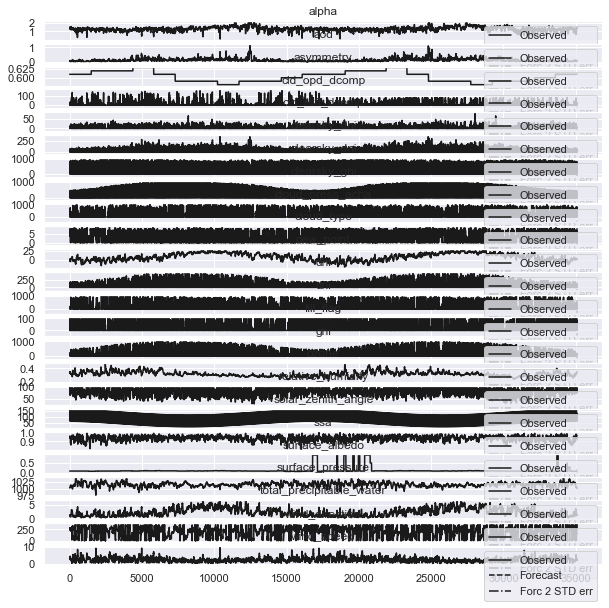

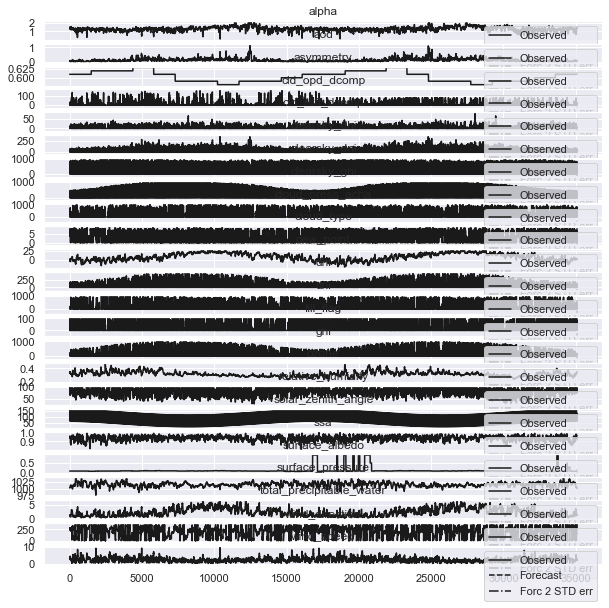

In [175]:
# plotting
results.plot_forecast(5)

In [174]:
# Evaluation
fevd = results.fevd(5)
fevd.summary()

FEVD for alpha
        alpha       aod  asymmetry  cld_opd_dcomp  cld_reff_dcomp  clearsky_dhi  clearsky_dni  clearsky_ghi  cloud_press_acha  cloud_type  dew_point       dhi       dni  fill_flag       ghi     ozone  relative_humidity  solar_zenith_angle       ssa  surface_albedo  surface_pressure  total_precipitable_water  wind_direction  wind_speed
0    1.000000  0.000000   0.000000       0.000000        0.000000      0.000000      0.000000      0.000000          0.000000    0.000000   0.000000  0.000000  0.000000   0.000000  0.000000  0.000000           0.000000            0.000000  0.000000        0.000000          0.000000                  0.000000        0.000000    0.000000
1    0.990014  0.000135   0.000000       0.000083        0.000003      0.000013      0.000661      0.000012          0.000003    0.000023   0.000047  0.000008  0.000036   0.000002  0.000021  0.000034           0.000395            0.000012  0.004745        0.000001          0.000704                  0.001884   

In [ ]:
lag_order=results.k_ar


# SARIMA

In [73]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [74]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00+00:00,2020-01-01 00:00:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,116.02,0.94,0.08,1003.0,1.3,231.0,2.6,2020,1,1
2020-01-01 00:30:00+00:00,2020-01-01 00:30:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,121.66,0.94,0.08,1003.0,1.2,233.0,2.7,2020,1,1
2020-01-01 01:00:00+00:00,2020-01-01 01:00:00+00:00,4.2,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,127.33,0.94,0.08,1003.0,1.2,235.0,2.7,2020,1,1
2020-01-01 01:30:00+00:00,2020-01-01 01:30:00+00:00,4.0,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,133.00,0.94,0.08,1003.0,1.1,244.0,2.9,2020,1,1
2020-01-01 02:00:00+00:00,2020-01-01 02:00:00+00:00,3.9,1.41,0.0767,0.61,0.0,0.0,0.0,0.0,0.0,...,138.62,0.94,0.08,1003.0,1.1,252.0,3.0,2020,1,1


In [85]:
result_a=seasonal_decompose(df2['ghi'],model='additive')
result_a.plot()

ValueError: You must specify a period or x must be a pandas object with a PeriodIndex or a DatetimeIndex with a freq not set to None

In [157]:
model = SARIMAX(df['ghi'], order=(4,2,4),seasonal_order=(1,24,1,12))

C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_d

In [ ]:
model_fit=model.fit()

C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


In [ ]:
residuals = model_fit.resid

In [ ]:
residuals.plot()

In [150]:
output = model_fit.forecast()

C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:843: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  data=self.data,


In [151]:
output

35088    3.132641
dtype: float64

In [152]:
model_fit.forecast(12)

C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\tsa\base\tsa_model.py:843: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  data=self.data,


35088     3.132641
35089     5.496986
35090    12.096151
35091    16.838036
35092    14.210596
35093    15.676204
35094    16.671333
35095    12.241655
35096     7.246709
35097     3.772342
35098     2.009200
35099     2.650303
Name: predicted_mean, dtype: float64

In [153]:
yhat = model_fit.predict()

In [154]:
yhat.head()

timestamp_solar
2020-01-01 00:00:00+00:00    0.0
2020-01-01 00:30:00+00:00    0.0
2020-01-01 01:00:00+00:00    0.0
2020-01-01 01:30:00+00:00    0.0
2020-01-01 02:00:00+00:00    0.0
Name: predicted_mean, dtype: float64

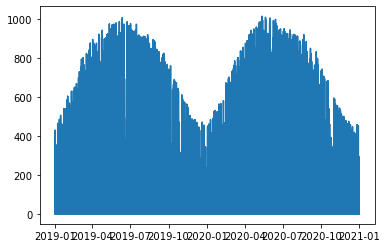

In [156]:
pyplot.plot(df['ghi'])
#pyplot.plot(yhat, color='red')